# Нейронные сети
## Урок 7. Обнаружение объектов

### Домашнее задание

Либо 1 пункт, либо пункт 2.

1. Сделайте краткий обзор любой научной работы, посвящённой алгоритму для object detection, не рассматривавшемуся на уроке. Проведите анализ: чем отличается выбранная вами архитектура нейронной сети от других? В чём плюсы и минусы данной архитектуры? Какие могут возникнуть трудности при применении этой архитектуры на практике?
2. Поиграться с кодом урока в разделе Advanced, поменять код и написать свои выводы.

# Обнаружение объектов с помощью KerasCV

**Author:** [lukewood](https://twitter.com/luke_wood_ml), Ian Stenbit, Tirth Patel<br>
**Date created:** 2023/04/08<br>
**Last modified:** 2023/08/10<br>
**Description:** Train an object detection model with KerasCV.<br>
**Оригинал:** [статья на keras.io](https://keras.io/guides/keras_cv/object_detection_keras_cv/)<br>
**Перевод**: Ростислав Ромашин<br>
**Дата перевода**: 2024/02/29<br>
<font color="green"><i><b>Зеленый курсив:</b> замечания от переводчика</i></font><br>
<font color="green"><b># Комментарии в коде:</b> пояснения к коду от переводчика</font>

KerasCV предлагает полный набор API производственного уровня для задач по обнаружению объектов.
Данные API включают специфичные для обнаружения объектов техники аугментации, нативные метрики Keras COCO, утилиты конвертации форматов объектных рамок, инструменты визуализации, предобученные модели распознавания объектов и все, что нужно для тренировки моделей по обнаружению объектов на ваших изображениях.

Давайте установим API KerasCV для обнаружения объектов.

<font color="green"><i>Во избежание появления ошибок в коде необходимо:<br>1. Сменить среду выполнения на T4 GPU для ускорения выполнения кода<br>2. Сделать апгрейд tensorflow, при необходимости перезапустить среду</i></font>

In [ ]:
!pip install --upgrade tensorflow # ставим последнюю версию tensorflow
!pip install keras # установка frontend-части
!pip install keras-cv # расширение фронта пакетом для компьютерного зрения

In [ ]:
import os # импорт библиотеки работы с системными переменными
# JAX - это высокопроизводительная библиотека для машинного обучения, компилирующая Python-код в машинный код для ускорения выполнения.
os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data # модуль работы с данными
import tensorflow_datasets as tfds # TFDS предоставляет доступ к различным наборам данных
import keras # библиотеку Keras
import keras_cv # утилиты и модели для компьютерного зрения
import numpy as np # массивы и матрицы
from keras_cv import bounding_box # для объектных рамок
from keras_cv import visualization #  визуализации результатов работы моделей компьютерного зрения
import tqdm # прогресс-бары в циклах итерации

Using JAX backend.


## Введение в обнаружение объектов

Обнаружение объектов - это процесс идентификации, классификации и локализации объектов на заданном изображении. Обычно, на вход подаются изображение и метки, каждая из которых, связанна с определенным классам объектных рамок.

Обнаружение объектов можно отнести к задаче расширенной классификации, где, вместо одного класса для одного изображения, вы должны обнаружить произвольный набор классов.

**Например:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

Данные для картинки сверху могут выглядеть следующим образом:
```python
image = [height, width, 3] # картинка в виде трехмерного массива
bounding_boxes = {
  "classes": [0], # 0 - ID произвольного класса представляющего кошку "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # объектная рамка имеет  формат "rel_xywh, т.е. расположение рамки относительно изображения"
   # где 0.25 означает, что координата X левого верхнего угл рамки расположена на 25% правее относительно левого верхнего угла изображения
   # 0.4 означает, что координата Y левого верхнего угл рамки расположена на 40% ниже относительно левого верхнего угла изображения
   # .15 ширина рамки 15% относительно ширины картинки
   # .1 высота рамки 10% относительно высоты картинки
}
```

С  появлением [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(он же YOLO), задачи по обнаружению объектов решаются с помощью глубокого обучения. Большинство архитектур машинного обучения делают умное разбиение одной задачи по обнаружению, на множество небольших задач по классификации и множество задач по регрессии.

Если быть более точным, то происходит генерация многоякорных рамок различных форм и размеров на входном изображении и каждой рамке присваивается класс, в соответствии со смещением по x, y, ширине и высоте. Модель обучается предсказывать класс каждой рамки, в соответствии со смещениями по осям x и y, ширине, высоте для каждой рамки с предполагаемым объектом.

**Пример визуализации якорных рамок**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Обнаружение объектов технически сложная задача, но к счастью, мы можем предложить безупречный подход для получения отличного результата. Приступим!

## Обнаружение с помощью предобученной модели

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

Самый верхний уровень API в KerasCV это интерфейс обнаружения объектов: `keras_cv.models`.
Этот API включает полностью предобученную модель по обнаружению объектов, такую как `keras_cv.models.YOLOV8Detector`.

Давайте начнем с построения модели YOLOV8Detector предобученной на наборе данных `pascalvoc`.

In [ ]:
# в переменную pretrained_model загружается предобученная модель по обнаружению объектов YOLOV8Detector
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # параметры модели, оптимизированные для обнаружения объектов в наборе данных Pascal VOC
    bounding_box_format="xywh" # формат объектных рамок
)

100%|██████████| 2.27k/2.27k [00:00<00:00, 949kB/s]
100%|██████████| 99.5M/99.5M [00:02<00:00, 46.8MB/s]
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


In [ ]:
type(pretrained_model)

keras_cv.src.models.object_detection.yolo_v8.yolo_v8_detector.YOLOV8Detector

<font color=green><i>Перевод вывода типа данных pretrained_model:</i></font>

```python
keras_cv.src.models.object_detection.yolo_v8.yolo_v8_detector.YOLOV8Detector
def error_handler(*args, **kwargs)

Реализует архитектуру YOLOV8 для обнаружения объектов.

Аргументы:
    backbone: `keras.Model`, должен реализовывать свойство `pyramid_level_inputs`
        С ключами "P2", "P3" и "P4" и именами слоев в качестве значений.
        Хорошим выбором для использования является `keras_cv.models.YOLOV8Backbone`.
    num_classes: целое число, количество классов в вашем наборе данных, исключая
        класс фона. Классы должны быть представлены целыми числами в
        диапазоне [0, num_classes).
    bounding_box_format: строка, формат объектных рамок входного набора данных.
        Обратитесь к документации keras.io для получения более подробной информации
        о поддерживаемых форматах объектных рамок.
    fpn_depth: целое число, спецификация глубины блоков CSP в
        Сети пирамид признаков. Обычно это 1, 2 или 3, в зависимости
        от размера вашей модели YOLOV8Detector. Рекомендуется использовать 3 для
        "yolo_v8_l_backbone" и "yolo_v8_xl_backbone". По умолчанию равно 2.
    label_encoder: (Необязательно) `YOLOV8LabelEncoder`, который
        отвечает за преобразование объектных рамок в обучаемые метки для
        YOLOV8Detector. Если не предоставлено, используется значение по умолчанию.
    prediction_decoder: (Необязательно) Слой `keras.layers.Layer`, который
        отвечает за преобразование предсказаний YOLOV8
        объектных рамок. Если не предоставлено, используется значение по умолчанию.
        Слой по умолчанию `prediction_decoder` - это слой
        `keras_cv.layers.MultiClassNonMaxSuppression`, который использует
         подавление немаксимумов для объектных рамок.

Примеры:

images = tf.ones(shape=(1, 512, 512, 3))
labels = {
    "boxes": tf.constant([
        [
            [0, 0, 100, 100],
            [100, 100, 200, 200],
            [300, 300, 100, 100],
        ]
    ], dtype=tf.float32),
    "classes": tf.constant([[1, 1, 1]], dtype=tf.int64),
}

model = keras_cv.models.YOLOV8Detector(
    num_classes=20,
    bounding_box_format="xywh",
    backbone=keras_cv.models.YOLOV8Backbone.from_preset(
        "yolo_v8_m_backbone_coco"
    ),
    fpn_depth=2
)

# Оценка модели без декодирования рамок и NMS
model(images)

# Предсказание с декодированием рамок и NMS
model.predict(images)

# Обучение модели
model.compile(
    classification_loss='binary_crossentropy',
    box_loss='ciou',
    optimizer=tf.optimizers.SGD(global_clipnorm=10.0),
    jit_compile=False,
)
model.fit(images, labels)
```

Заметили аргумент с названием `bounding_box_format`?

Вспоминаем, ранее описанный, формат словаря bounding boxes:

```
bounding_boxes = {
  "classes": [num_boxes],
  "boxes": [num_boxes, 4]
}
```

Данный аргумент описывает какой *точно* будет формат значений у ключа `"boxes"` в словаре, который отправится далее по конвейеру.
Например, рамка в формате `xywh` в ее верхнем левом углу имеет координаты x= 100, y=100, ширина 55 и высота 70, тогда значение будут выглядеть:
```
[100, 100, 55, 75]
```

что эквивалентно значению в формате `xyxy`:

```
[100, 100, 155, 175]
```

Кажется очень простым, но это критически важный момент в понимании API обнаружения объектов в KerasCV!
Каждому компоненту, вычисляющему рамки объектов, требуется аргумента `bounding_box_format`.

Подробнее о KerasCV, вы можете почитать тут: [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Так получилось, из-за того что нет единого стандарта, описывающего формат объектной рамки!
В различных конвейерах, его компоненты ожидают разные форматы, таким образом, их нужно указывать явно, для того, чтобы наш код оставался читаемым, переиспользуемым и ясным.

Баг связанный с неправильным форматом объектной рамки, возможно, самый частый баг, лежащий в основе проблем обнаружения внутри конвейера - и явно указывая формат мы исключаем подобные баги  (особенно если копипастим код из разных источников).

Далее, давайте загрузим изображение:

<font color="green"><i>Может возникнуть ошибка 429 при попытке загрузить с веб-сервера картинку, если на нем установлены ограничения на количество скачиваний за единицу времени, тогда, нужно выбрать другой источник для скачивания изображения</i></font>

264095/264095 [==============================] - 0s 0us/step
(372, 490, 3)


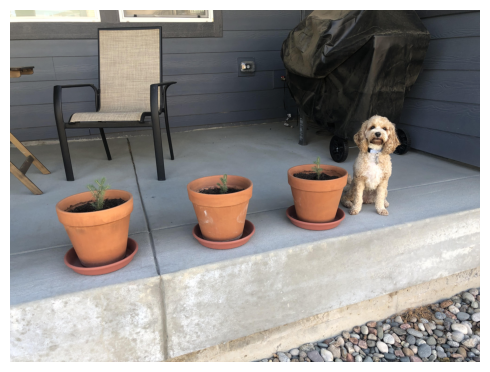

In [ ]:
# путь к картинке
filepath = keras.utils.get_file(origin="https://keras.io/img/guides/object_detection_keras_cv/object_detection_keras_cv_8_0.png")
image_png = keras.utils.load_img(filepath) # загружаем картинку в память
image = np.array(image_png)
# Далее закоментировал код, что бы выводилась одна картинка, а не две, часть кода излишняя
# visualization.plot_image_gallery(
#     np.array([image]),  # преобразуем картинку в массив
#     value_range=(0, 255), # диапазон значений пикселей
#     rows=0,
#     cols=0,
#     scale=5, # масштаб
# )
print(image.shape) # вывод формы матрицы
image_png # вывод, загруженной картинки

Для использования архитектуры `YOLOV8Detector` с сеткой ResNet50 в качестве основы, вам нужно изменить размеры картинки, так чтобы они были кратны 64.
Это нужно для того, чтобы быть уверенным в совместимости с количеством точек разрешения, при дальнейшем уменьшении размерностей в сверточных уровнях сети ResNet.

Если, операция изменения размера исказит входное соотношение, модель будет более слабой.  
Для предобученной модели `"yolo_v8_m_pascalvoc"`, те настройки которые мы используем, отразятся на конечной метрике `MeanAveragePrecision`, на примере набора данных `pascalvoc/2012` расчетный коэффициент упадет до `0.15` с `0.38`, при использовании встроенных операций изменения размеров.

Вдобавок, если для сохранения пропорций применить обрезку, как это делается в задачах по классификации, то ваша модель может вовсе потерять часть рамок.  И если, требуется сохранить соотношения сторон, то мы рекомендуем использовать padding (дополнение пустотой), чтобы дополнить короткую сторону пустотой до более длинной при изменении разрешения.

С помощью KerasCV изменения размеров изображения делается легко: необходимо задать аргумент `pad_to_aspect_ratio=True` в слое `keras_cv.layers.Resizing`.

Это можно сделать одной строчкой кода:

In [ ]:
inference_resizing = keras_cv.layers.Resizing( # предпроцессный слой служит для изменения размера
    640, # желаемая высота картинки в пикселях
    640, # желаемая ширина картинки в пикселях
    pad_to_aspect_ratio=True, # прибавить пустоту для соблюдения пропорций
    bounding_box_format="xywh" # формат объектных рамок
)

Передадим дальше по конвейеру:

In [ ]:
# методу inference_resizing() передаем картинку в виде тензора, обратно получаем обработанный тензор
image_batch = inference_resizing([image])
type(image_batch)

tensorflow.python.framework.ops.EagerTensor

`keras_cv.visualization.plot_bounding_box_gallery()` поддерживает параметр `class_mapping` для определения классов объектных рамок.

Давайте отобразим наши классы.

In [ ]:
class_ids = [  # ID классов
    "Aeroplane", # самолет
    "Bicycle", # велосипед
    "Bird", # птица
    "Boat", # лодка
    "Bottle", # бутылка
    "Bus", # автобус
    "Car", # машина
    "Cat", # кошка
    "Chair", # стул
    "Cow", # корова
    "Dining Table", # столик
    "Dog", # собака
    "Horse", # лошадь
    "Motorbike", # мотоцикл
    "Person", # человек
    "Potted Plant", # цветочный горшок
    "Sheep", # овца
    "Sofa", # диван
    "Train", # поезд
    "Tvmonitor", # ТВ-экран
    "Total", # все остальное
]
class_mapping = dict(zip(range(len(class_ids)), class_ids)) # помещаем все классы в словарь
type(class_mapping)

dict

Как и в любой другой модели, в нашей `keras.Model` мы можем предсказать объектные рамки с помощью интерфейса `model.predict()`.

1/1 [==============================] - 23s 23s/step


{'boxes': array([[[444.2204  , 148.84406 ,  86.8009  , 134.13065 ],
         [ 70.62043 , 231.14268 , 108.3713  , 126.58809 ],
         [242.65146 , 225.67609 ,  90.71002 ,  98.142334],
         [ 74.05309 ,  30.941978, 149.5983  , 207.77441 ],
         [372.7144  , 207.33917 ,  84.1499  ,  94.1705  ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  -1.      ],
         [ -1.      ,  -1.      ,  -1.      ,  

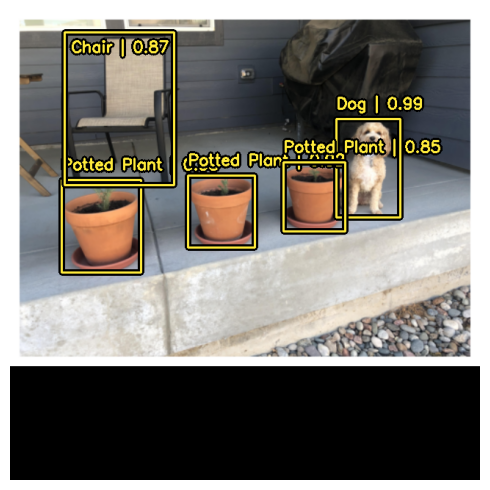

In [ ]:
# в метод predict() передаем обработанный тензор изображения
# тензор изображения обрабатывается с помощью предобученной модели
# на выходе получаем предсказанный словарь тензоров
y_pred = pretrained_model.predict(image_batch)
# словарь y_pred содержит следующие тензоны:
# {"classes": ..., boxes": ..., confidence: ..., num_detections: ...} - подробное описание ниже в тексте
# визуализация объектных рамок на картинке
visualization.plot_bounding_box_gallery(
    image_batch, # обработанное изображение
    value_range=(0, 255), # диапазон значений пикселей
    rows=1, # количество строк в галерее на выходе
    cols=1, # количество столбцов в галерее на выходе
    y_pred=y_pred, # указатель на тензор с предсказанными данными, на основе него строим рамки на выходном рисунке
    scale=5, # масштаб изображения
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами объектов, для обозначения их на выходном рисунке
)
y_pred # вывод на экран тензора, для того чтобы понять как он выглядит, ниже

<font color=green><i>Переменная <b>y_pred</b> - это словарь, в котором каждый элемент содержит тензоры, т.е. массивы с параметрами.<br>
В нашем случае, словарь содержит следующие тензоры:<br>
<b>boxes:</b>содержит 5 массивов с параметрами конкретной объектной рамки, каждый массив имеет 4 значения - x, y, w(idth), h(ight)<br>
<b>confidence:</b> уровень уверенности, в том что конкретная рамка является тем, чем ее распознали (относительный параметр)<br>
<b>classes</b> - индексы (номера) распознанных классов объектов<br>
<b>num_detections</b> - количество найденных классов<br><br>
Распознаем другую картинку, с техникой:</i></font>

1/1 [==============================] - 0s 177ms/step


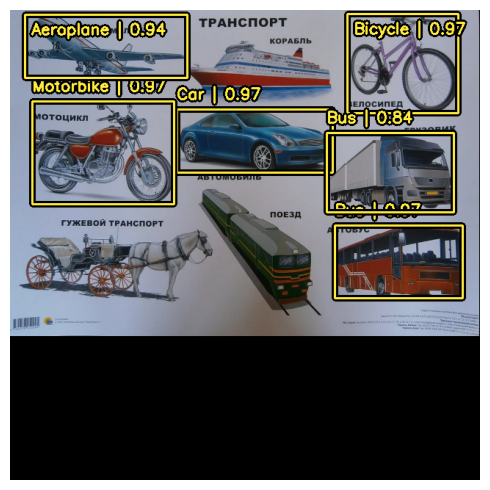

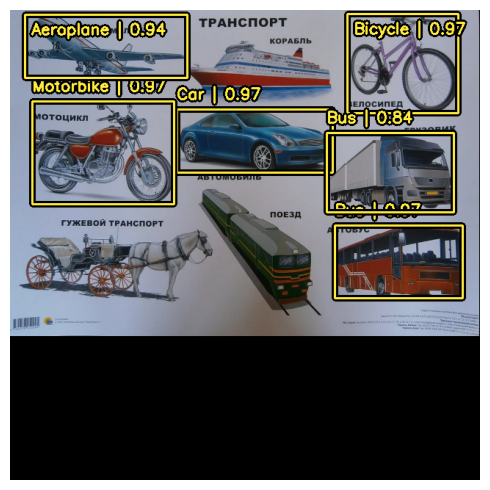

In [ ]:
# указываем путь к картинке с техникой в интернете
file2 = keras.utils.get_file(origin="https://stihi.ru/pics/2019/03/20/1028.jpg")
# скачаем и переведем картинку в матрицу с помощью средств Кераса
image2 = np.array(keras.utils.load_img(file2))
# зададим конвейер для обработки картинки
image_batch2 = inference_resizing([image2])
# распознаем картинку и результат помещаем в тензор
y_pred = pretrained_model.predict(image_batch2)
# визуализируем объектные рамки на картинке
visualization.plot_bounding_box_gallery(
    inference_resizing([image2]), # обработанная картинка
    value_range=(0, 255), # диапазон значений пикселей
    rows=1, # кол-во строк в визуализации
    cols=1, # кол-во столбцов в визуализации
    y_pred=y_pred, # указатель на тензор
    scale=5, # масштаб
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # объектные рамки
    class_mapping=class_mapping, # указываем наш словарь с классами
)

<font color=green><i>Не все объекты с техникой обнаружены, исправим далее.</i></font>

Для поддержания простоты во входном потоке, KerasCV применяет метод подавления немаксимумов (NMS) в классе `YOLOV8Detector`.
Метод подавления немаксимумов - традиционный компьютерный алгоритм, который решает задачу обнаружения моделью множества рамок для одного и того же объекта.

Подавление немаксимумов хорошо настраиваемый алгоритм, вам в большинстве случаев нужно будет лишь указать аргументы для метода немаксимумов.
Это можно сделать с помощью переопределения аргумента `prediction_decoder`.

Для демонстрации такой концепции, давайте временно отключим подавление немаксимумов в нашей модели  YOLOV8Detector.  
Это можно сделать, дописав атрибут `prediction_decoder`.

1/1 [==============================] - 3s 3s/step


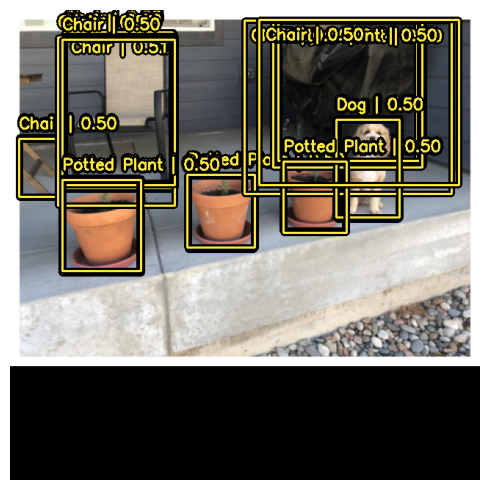

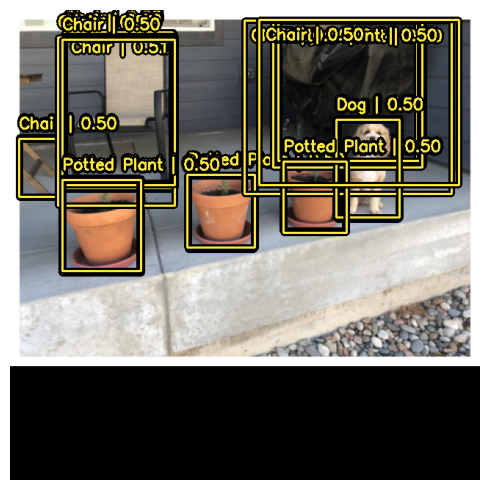

In [ ]:
# Метод NonMaxSuppression слой предназначен для регулирования подавления немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат рамок
    from_logits=True, # отключаем использование в этом слое функций активации
    iou_threshold=1.0, # значение данного порога равное единице, означает полно отключение подавление немаксимумов
    confidence_threshold=0.0, # порог уровня уверенности равную нулю, позволяет отобразить все предполагаемые объектные рамки
)
# предобученная модель YOLO
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # конкретный тип модели YOLO, обученной на наборе данных Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # указатель на слой декодера без подавления немаксимумов
)
# получаем тензор от предобученной модели
y_pred = pretrained_model.predict(image_batch)
# визуализируем картинки с объектными рамками
visualization.plot_bounding_box_gallery(
    image_batch, # обработанная картинка
    value_range=(0, 255), # диапазон значений пикселей
    rows=1, # кол-во строк в галерее
    cols=1, # кол-во столбцов в галерее
    y_pred=y_pred, # указатель на тензор с предсказанными значениями
    scale=5, # масштаб
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами
)


<font color=green><i>После полного подавления немаксимоумов, получаем все возможные варианты объектных рамок на изображении<br>
Посмотрим на подавление немаксимумов на картинке с техникой</i></font>

1/1 [==============================] - 0s 85ms/step


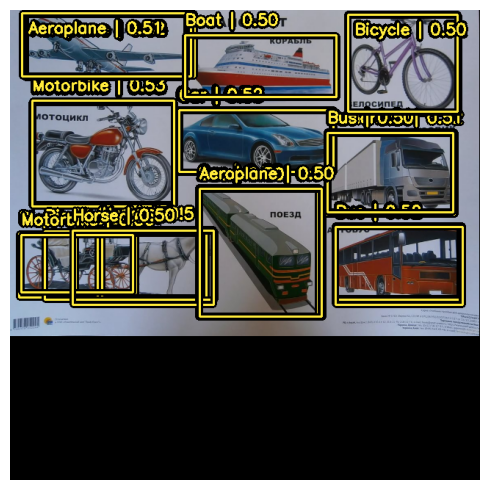

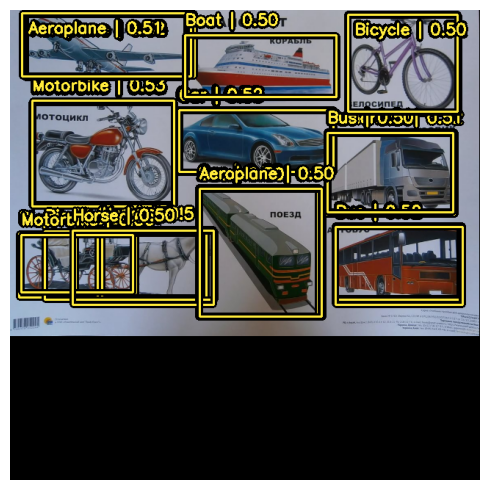

In [ ]:
# тензор предсказаний для второй картинки с техникой
y_pred = pretrained_model.predict(image_batch2)
# визуализация картинки с рамками
visualization.plot_bounding_box_gallery(
    image_batch2, # обработанная картинка
    value_range=(0, 255), # значения пикселей
    rows=1, # кол-во строк
    cols=1, # кол-во столбцов
    y_pred=y_pred, # указатель на тензор
    scale=5, # масштаб картинки
    font_scale=0.7, # размер шрифта
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами
)

<font color=green><i>Результат получился лучше, чем с цветками, а именно:<br>
Множественные рамки не появились на большинстве объектах.<br>
Теперь все объекты имеют рамки, пусть и не с точным соответствием классам.<br>
Поезд - определился как самолет, вместо кареты несколько мотоциклов, но в целом модель смогла выделить все объекты.<br>
Настройка порогов уверенности и немаксимумов, позволяет более точно выделить объекты.</i></font>

Далее, давайте перенастроим `keras_cv.layers.NonMaxSuppression` для нашего примера!
Мы настроим параметр `iou_threshold` на `0.2` и параметр `confidence_threshold` на `0.7`.

Увеличение значение параметра `confidence_threshold`, влияет на модель так, что на выходе будут объектные рамки с более высоким уровнем доверия.

`iou_threshold` - контролирует порог "пересечения над слиянием" (IoU), который будет таким, чтобы из двух рамок осталась только одна.
[Более подробное описание данного параметра смотрите в документации TensorFlow API docs](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

1/1 [==============================] - 3s 3s/step


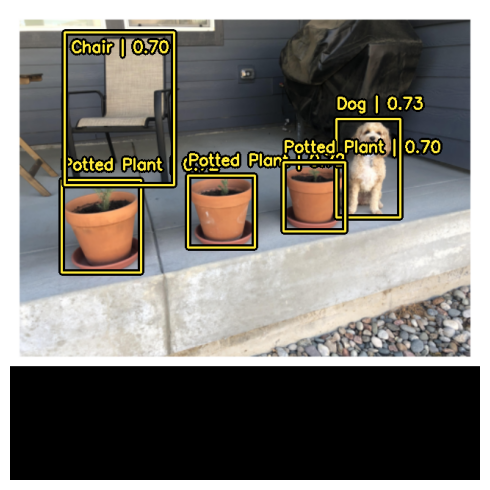

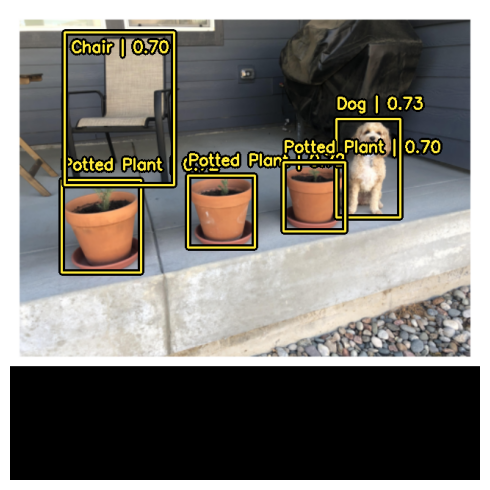

In [ ]:
# слой NonMaxSuppression, позволяет контролировать подавление немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат объектных рамок
    from_logits=True, # применение логитов, позволяет обойтись без функции активации в данном слое.
    iou_threshold=0.2, # уменьшая порог IOU, отсекаем плохо распознаные объекты
    confidence_threshold=0.7, # настройка порога уверенности позволяет контролировать подавление немаксимумов
)
# получаем настройки предобученной модели YOLO
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # модель YOLO, предобученная на картинках из набора Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # тип декодера, в нашем случае, он определен выше - подавление немаксимумов
)
# получаем тензоры предсказаний
y_pred = pretrained_model.predict(image_batch)
# визуализации объектных рамок
visualization.plot_bounding_box_gallery(
    image_batch, # указатель на обработанную картинку
    value_range=(0, 255), # диапазон пикселей картинки
    rows=1, # кол-во строк
    cols=1, # кол-во столбцов
    y_pred=y_pred, # указатель на тензор с предсказанными параметрами
    scale=5, # масштаб картинки
    font_scale=0.7, # размер шрифтов
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами объектов
)

<font color=green><i>Настроим пороги для картинки с техникой так, чтобы одному объекту соответствовала одна рамка</i><font>

1/1 [==============================] - 3s 3s/step


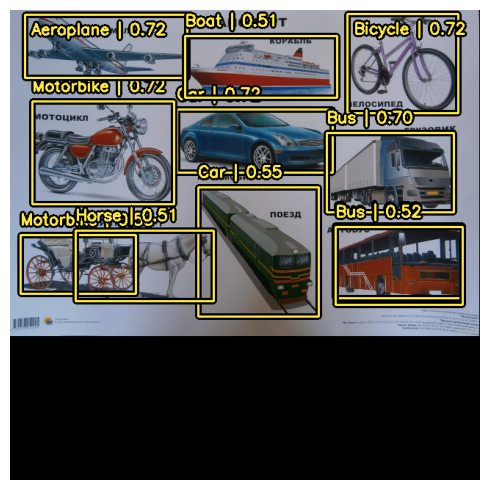

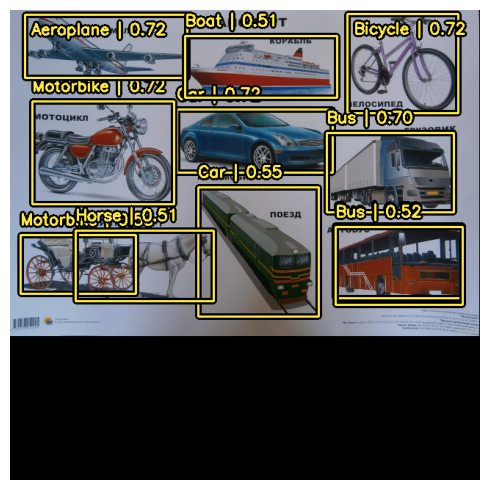

In [ ]:
# слой NonMaxSuppression, позволяет контролировать подавление немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат объектных рамок
    from_logits=True, # применение логитов, позволяет обойтись без функции активации в данном слое.
    iou_threshold=0.9, # уменьшая порог IOU, отсекаем плохо распознаные объекты
    confidence_threshold=0.51, # настройка порога уверенности позволяет контролировать подавление немаксимумов
)
# получаем настройки предобученной модели YOLO
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # модель YOLO, предобученная на картинках из набора Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # тип декодера, в нашем случае, он определен выше - подавление немаксимумов
)
# получаем тензоры предсказаний
y_pred = pretrained_model.predict(image_batch2)
# визуализации объектных рамок
visualization.plot_bounding_box_gallery(
    image_batch2, # указатель на обработанную картинку
    value_range=(0, 255), # диапазон пикселей картинки
    rows=1, # кол-во строк
    cols=1, # кол-во столбцов
    y_pred=y_pred, # указатель на тензор с предсказанными параметрами
    scale=5, # масштаб картинки
    font_scale=0.7, # размер шрифтов
    bounding_box_format="xywh", # формат объектных рамок
    class_mapping=class_mapping, # указатель на словарь с классами объектов
)

<font color=green><i>В итоге каждому объекту соответствует одна рамка.<br>При порогах: iou=0.9 и уверенности=0.51</i><font>

Так гораздо лучше!

## Обучение нестандартных моделей

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Не важно, любитель ли вы в области обнаружения объектов, либо уже ветеран, сборка конвейера по обнаружению объектов с нуля, будет являться сложным делом, в любом случае.
К счастью, все интерфейсы по обнаружению объектов в KerasCV построены по модульному принципу.
Не важно, нужен ли вам готовый контейнер, либо просто модель по обнаружению, либо просто механизм преобразования формата из `xywh` в формат`xyxy`, KerasCV все это осилит.

В данном руководстве, мы собираем полностью обучаемый конвейер для модели обнаружения объектов на основе KerasCV.  Включая загрузку данных, аугментацию, расчет метрик и вывод!

Для начала, давайте разберемся со всеми входными данными и зададим глобальные параметры.

In [ ]:
BATCH_SIZE = 4

## Загрузка данных

Давайте определим форматы для загрузки и объектных рамок.
KerasCV имеет предопределенный формат для рамок.
Чтобы все это скомпоновать вместе, необходимо упаковать параметры рамок в словарь, как описано ниже:

```
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` содержит координаты рамок в формате `boun ding_box_format` поддерживаемым KerasCV.

KerasCV требует, чтобы аргумент `bounding_box_format` содержал все параметры, относящиеся к объектным рамкам.
Это сделано для увеличения ваших возможностей по включению индивидуальных параметров в конвейер, также, позволяя коду быть самодокументированным на протяжении всего конвейера.

Что бы соответствовать стилю API KerasCV, рекомендуется задать загрузчик данных, используя аргумент `bounding_box_format`.
Тогда тем, кто будет использовать ваш загрузчик данных, будет понятно, какой формат используется.

В этом примере, мы задаем формат для рамок вида `xywh`.

Пример:

```python
train_ds, ds_info = your_data_loader.load(
    split='train', bounding_box_format='xywh', batch_size=8
)
```

Это задаст точный формат для рамок вида `xywh`.  Об этом подробнее можно почитать в документации
KerasCV в разделе формат рамок [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Наши данные загружаются в формате `{"images": images, "bounding_boxes": bounding_boxes}`.
Данный формат поддерживается всеми предварительными компонентами KerasCV.

Давайте загрузим данные и проверим, что данные выглядят как ожидается.

In [ ]:
# функция визуализации данных
# на вход поступают аргументы: датасет, диапазон пикселей, кол-во строк, кол-во колонок, формат рамок
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1))) # создание итерируемого объекта из словаря тензоров картинки
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"] # призвоения соответсвующим переменным тензоров из словаря данных
    visualization.plot_bounding_box_gallery( # функция прорисовки картинок
        images, # тензор изображения
        value_range=value_range, # диапазон пикселей
        rows=rows, # кол-во строк
        cols=cols, # кол-во колонок
        y_true=bounding_boxes, # тензор предсказаний
        scale=5, # масштаб
        font_scale=0.7, # размер шрифта
        bounding_box_format=bounding_box_format, # формат объектных рамок
        class_mapping=class_mapping, # словарь объектных классов
    )

# функция распаковки (преобразования) "сырых" (необработанных) данных
def unpackage_raw_tfds_inputs(inputs, bounding_box_format): # на входе элементы словаря, и формат данных
    image = inputs["image"] # значение словаря по ключ image присваиваем переменной image
    # переменной рамок boxes присваивается конвертированное значения в соответствии с переданным форматом
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image, # текущая картинка переданная из функции load_pascal_voc
        source="rel_yxyx", # исходный относительный формат
        target=bounding_box_format, # конечный заданный формат
    )
    bounding_boxes = { # словарь формата объектных рамок
        "classes": inputs["objects"]["label"], # классы
        "boxes": boxes, # рамки
    }
    # возвращает словарь содержащий картинки и их форматы
    return {"images": image, "bounding_boxes": bounding_boxes}

# функция загрузки данных
def load_pascal_voc(split, dataset, bounding_box_format):
    # процедура загрузки сырых данных, с разбиением на части с тусованием
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    # структуризация данных по заданному формату с помощью параметра bounding_box_format
    ds = ds.map(
        # каждый элемент набора данных обрабатывается функцией unpackage_raw_tfds_inputs, возвращающей словарь
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        # настройка производительности - параллельные вычисления
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds # возвращаем датасет

# Загружаем тренировочные данные
train_ds = load_pascal_voc(split="train", # параметр, указывающий какую часть данных загрузить: train, test или val
                           dataset="voc/2007", # указываем тип и версия набора данных
                           bounding_box_format="xywh") # формат объектных рамок
# Загружаем тестовые данные
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")
# сокращаем размер тестовых данных в 10 раз
eval_ds = eval_ds.take(len(eval_ds)//200)
# Загружаем валидационные данные
val_ds = load_pascal_voc(split="validation", dataset="voc/2007", bounding_box_format="xywh")
print(f"{len(train_ds)=}, {len(eval_ds)=}, {len(val_ds)=}")
# "Тусуем" (перемешиваем) тренировочные данные блоками, в блоке 16 единиц данных
train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/4952 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteIDOALX/voc-test.tfrecord*...:   0%|          | 0/…

Generating train examples...:   0%|          | 0/2501 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteIDOALX/voc-train.tfrecord*...:   0%|          | 0…

Generating validation examples...:   0%|          | 0/2510 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incompleteIDOALX/voc-validation.tfrecord*...:   0%|        …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/4.0.0. Subsequent calls will reuse this data.
len(train_ds)=2501, len(eval_ds)=24, len(val_ds)=2510


Далее, давайте разобьем наши данные на пакеты.

В KerasCV для задач обнаружения объектов, пользователям рекомендуется применять разбиение данных на пакеты. Данный подход хорошо работает с изображениями разных размеров из датасета PascalVOC и даже с разным количеством объектных рамок на картинках.

Чтобы разбить датасет на пакеты в конвейере `tf.data`, можно использовать метод `ragged_batch()`.

In [ ]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, # разбиваем тренировочные данные на пакеты по 4 элемента
                                 drop_remainder=True) # отбрасывать не полные пакеты
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, # разбиваем тестовые данные на пакеты по 4 элемента
                               drop_remainder=True) # отбрасывать не полные пакеты
val_ds = val_ds.ragged_batch(BATCH_SIZE, # разбиваем валидационные данные на пакеты по 4 элемента
                               drop_remainder=True) # отбрасывать не полные пакеты

Давайте удостоверимся, что наш датасет соответствует ожидаемому формату KerasCV.
Используя функцию `visualize_dataset()`, вы можете проверить, что ваши данные в том формате, который ожидает KerasCV.  Если объектные рамки не видны, или видны в ошибочных местах, это верный признак того, что данные используют неправильный формат.

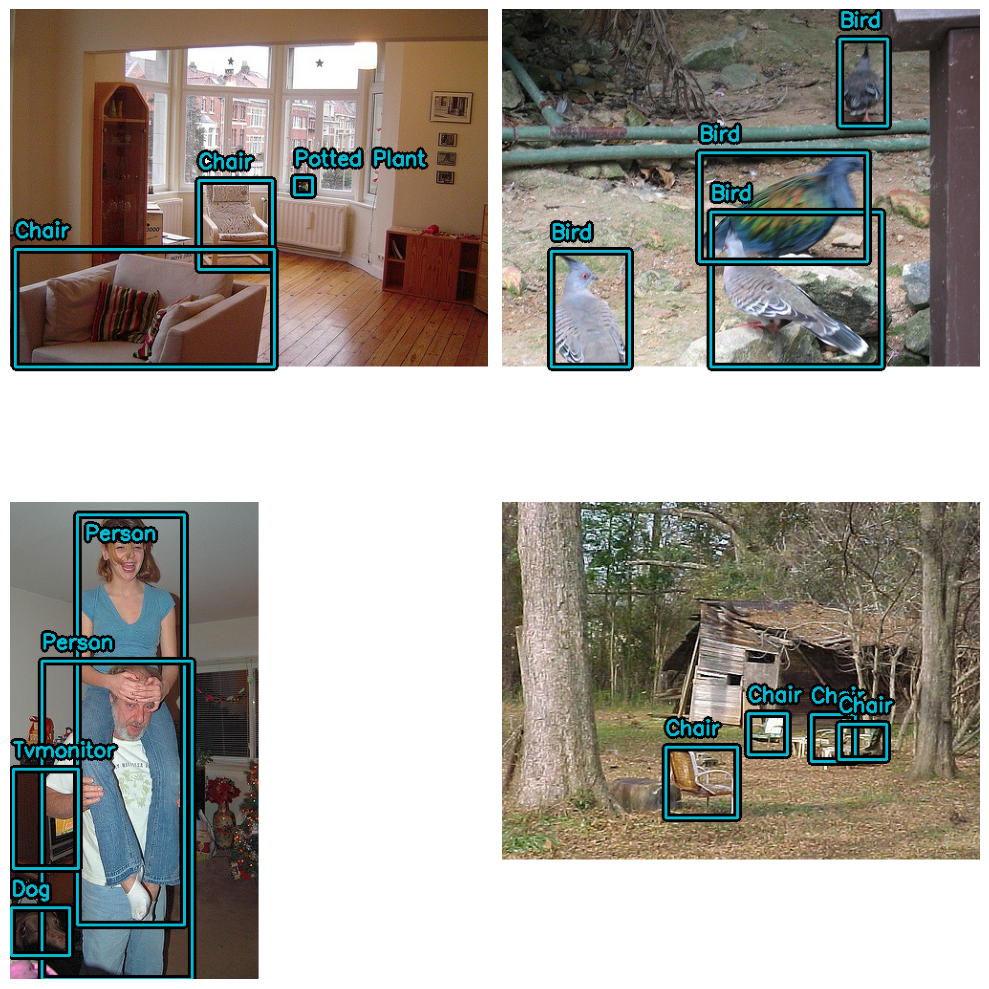

In [ ]:
visualize_dataset( # функция визуализация тренировочного набора данных, описана выше
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

И для тестового набора:

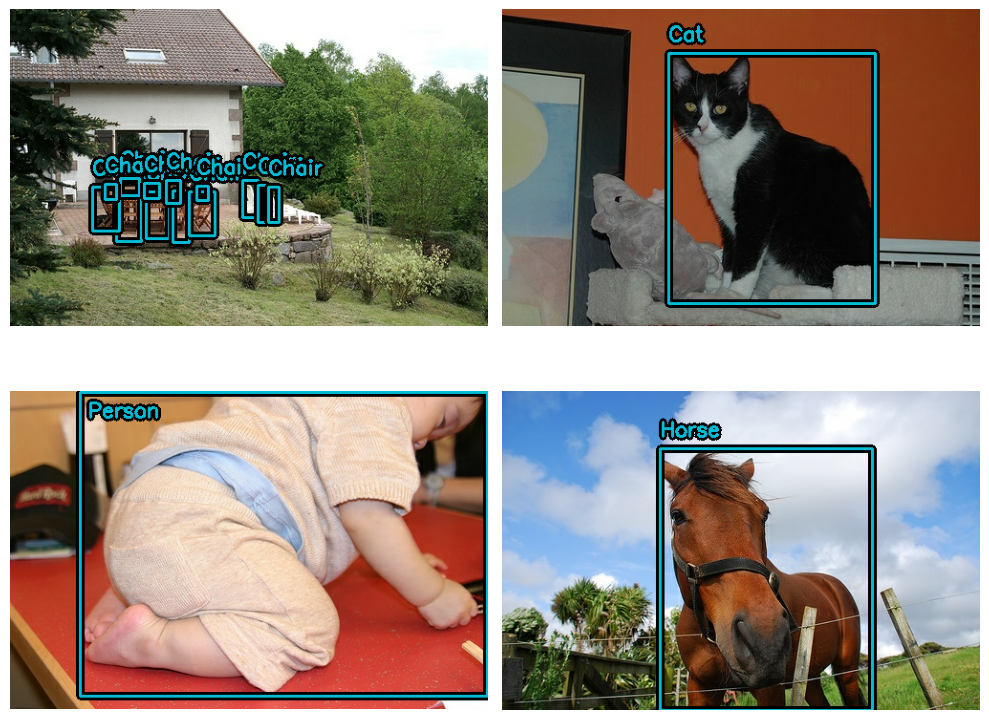

In [ ]:
visualize_dataset( # Визуализация тестового набора данных
    eval_ds, # тестовый набор данных
    bounding_box_format="xywh", # формат данных
    value_range=(0, 255), # диапазон значений пикселей
    rows=2, # количество картинок в строке
    cols=2, # количество столбцов в строке
    # Если эксперимент запускается не на локальной машине, можно также
    # указать через функцию `visualize_dataset()` вывод в файл с помощью переменной `path`:
    # path="eval.png"
)

<font color=green><i>Визуализация валидационного набора данных</i></font>

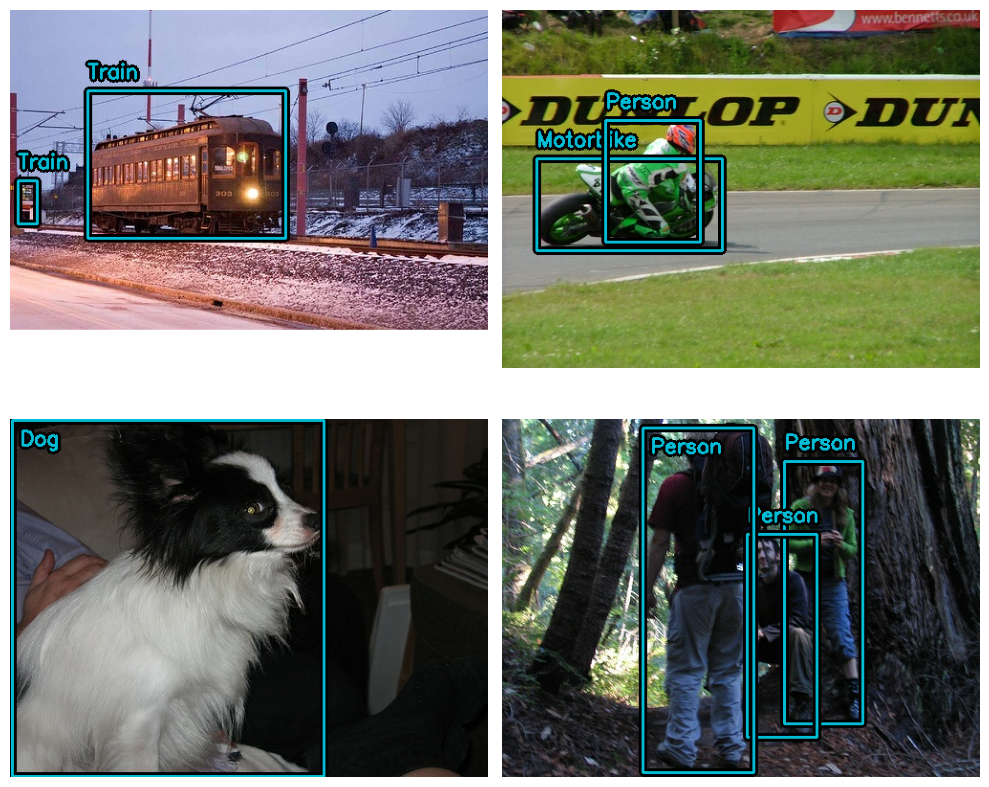

In [ ]:
visualize_dataset( # Визуализация валидационного набора данных
    val_ds, # тестовый набор данных
    bounding_box_format="xywh", # формат данных
    value_range=(0, 255), # диапазон значений пикселей
    rows=2, # количество картинок в строке
    cols=2, # количество столбцов в строке
    # Если эксперимент запускается не на локальной машине, можно также
    # указать через функцию `visualize_dataset()` вывод в файл с помощью переменной `path`:
    # path="eval.png"
)

Похоже на то, что все структурировано, как и ожидалось.
Теперь мы можем перейти к процессу создания конвейера аугментации данных.

## Аугментация данных

Одной из сложнейших задач в процессе создания конвейера по обнаружению образов, является аугментация данных.  Техника аугментации изображения должна учитывать характеристики объектных рамок и с ними должны происходить соответствующие изменения.

К счастью, KerasCV  поддерживает аугментацию объектных рамок, используя расширенную библиотеку [data augmentation layers](https://keras.io/api/keras_cv/layers/preprocessing/).

Далее код загружает набор данных Pascal VOC, и на лету применяет,
дружелюбную для объектных рамок аугментацию данных внутри конвейера `tf.data`.

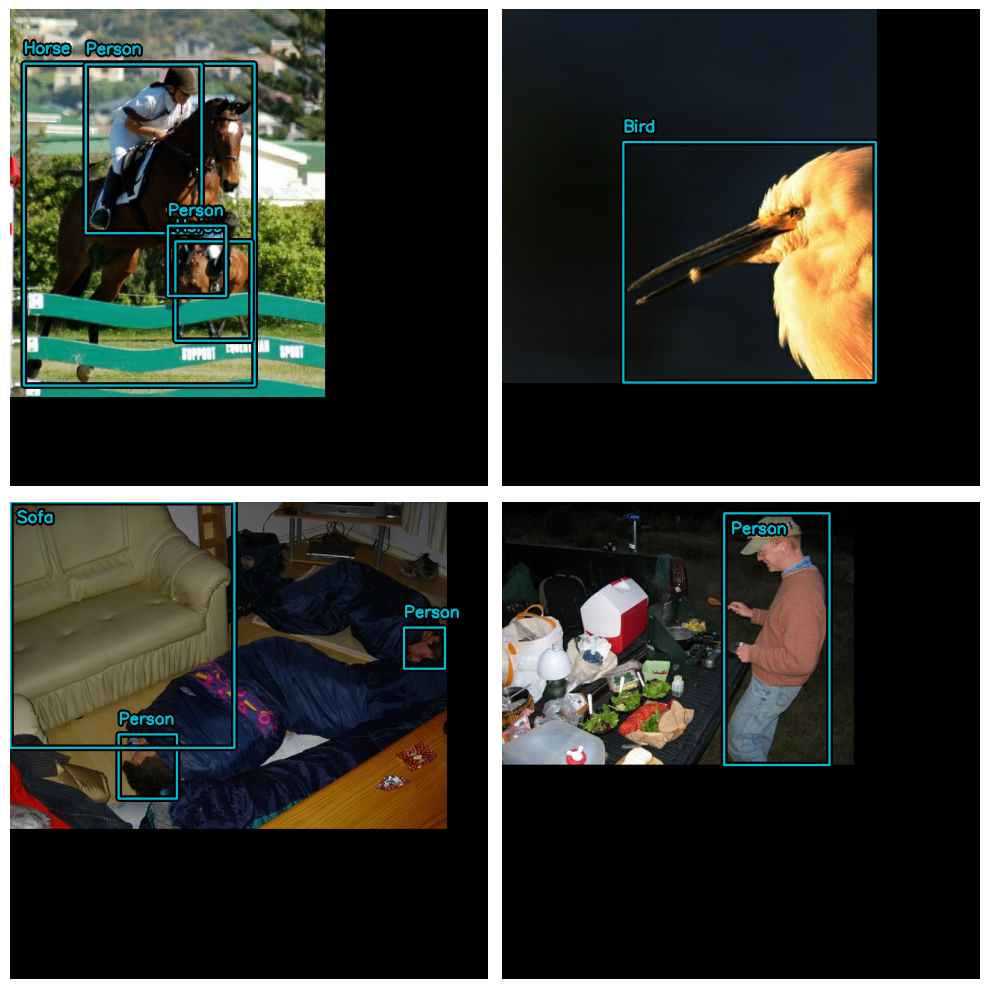

In [ ]:
# список который будет содержать аугментированные изображения
augmenters = [ # с помощью слоев кераса осуществляем предобработку изображений
    # случайное горизонтальное отражение картинки по формату xywh
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    # изменение размера до заданного, причем случайно могут быть увеличина на 75% и уменьшены на 30%
    keras_cv.layers.JitteredResize(target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn

# функция в виде переменной которой передан список
augmenter_fn = create_augmenter_fn(augmenters)

# обучающие данные подвергаем аугментации с поомщью функции augmenter_fn, используя параллельные вычисления
train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
# визуализация аугментированных данных
visualize_dataset(
    train_ds, # аугментированные обучающие данные
    bounding_box_format="xywh", # формат рамки
    value_range=(0, 255), # диапазон значений пикселей
    rows=2, # две строки картинок
    cols=2 # две колонки картинок
)

Великолепно! У нас сейчас есть дружелюбный к рамкам конвейер для аугментации данных.
Давайте зададим соответствующий формат для оценочных данных.  
Вместо использования метода `JitteredResize`, давайте используем более понятный для нашего слоя метод `keras_cv.layers.Resizing()`.

In [ ]:
# функция в качестве переменной с помощью слоя керас изменяет размеры картинки до нужного и делает паддинг
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
# тестовые данные аугментируются с помощью функции inference_resizing, используя параллельные вычисления
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

In [ ]:
# валиадционные данные аугментируются с помощью функции inference_resizing, используя параллельные вычисления
val_ds = val_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

Операция изменения размера тренировочных данных, использующая метод `JitteredResize()`, отличается от аналогичной операции над выходным набором данных, использующим метод `layers.Resizing(pad_to_aspect_ratio=True)`.

Хорошей практикой является визуализация и сравнение обоих датасетов:

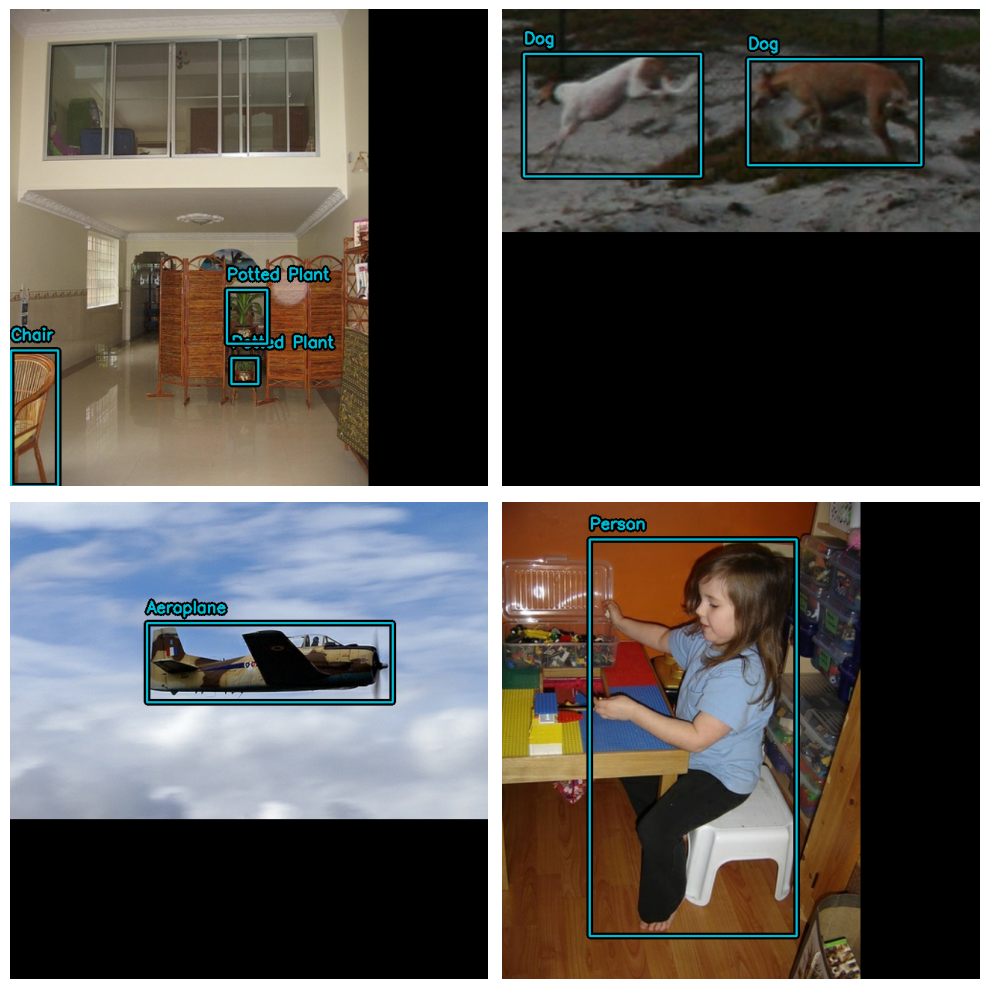

In [ ]:
# визуализация тестового датасета
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

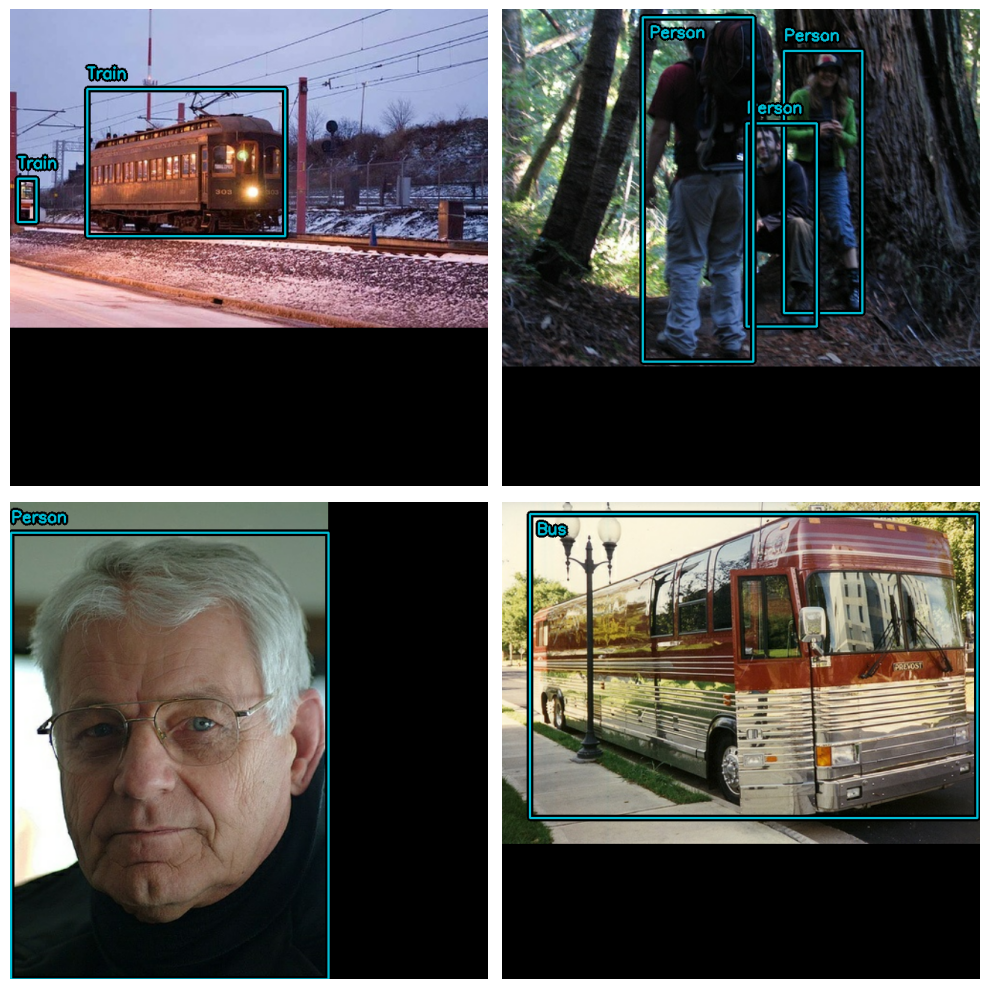

In [ ]:
# визуализация валидационного датасета
visualize_dataset(
    val_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Наконец, давайте распакуем наш входной словарь, и подготовим его на ввод в нашу модель. В соответствии с аппаратной архитектурой типа TPU, тензоры должны быть плотными (`Dense`), в противоположность неупорядоченным (`Ragged`).

<font color=green><i><b>Плотный тензор</b> - тип данных фиксированной длины<br>
<b>Неупорядоченный тензор</b> - тип данных переменной длины</i></font>

In [ ]:
# функция перевода словаря в кортеж
def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense( # метод перевода объектных рамок в фиксированный тип данных
        inputs["bounding_boxes"], max_boxes=32
    )

# перевод обучающих данных в кортеж фиксированной длинны где первый элемент картинка, воторой рамки
train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
# тоже что верхняя строка но для тестовых данных, обе строки используют параллельную обработку
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
# тоже что верхняя строка но для валидационных данных, обе строки используют параллельную обработку
val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
# предзагрузка данных, т.е. такой формат данных,
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
# который позволяет при обработке загружать следующую порцию данных для ускорения процесса обработки
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)
# который позволяет при обработке загружать следующую порцию данных для ускорения процесса обработки
val_ds = val_ds.prefetch(tf_data.AUTOTUNE)

### Оптимизатор

В этом руководстве, мы используем стандартный оптимизатор SGD (стохастический градиентный спуск) и обратные вызовы [`keras.callbacks.ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/) для контроля скорости обучения.

Вы должны всегда включать параметр `global_clipnorm` когда обучаете модель по обнаружению объектов. Это исключит проблему "градиентного взрыва", которая не редка при обучении моделей по обнаружению объектов.

In [ ]:
# переменная скорости обучения
base_lr = 0.01
# функция оптимизации
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr, # скорость обучения
    momentum=0.5, # параметр учитывающий в моменте процесс обучения, помогает ускориь процесс обучения
    # Важно! Задавайте всегда переменную global_clipnorm
    # это глобальная норма градиентов, т.е. все градиенты будут ограничены нормой равной десяти
    global_clipnorm=5.0
)

Чтобы достичь наилучшего результата с вашим набором данных, вы должны вручную задать расписание скорости обучения `PiecewiseConstantDecay`.
Расписания `PiecewiseConstantDecay` призваны улучшать производительность, но их нельзя использовать в других задачах.

### Функции потерь

Возможно, вы не знакомы с потерями типа `"ciou"`.
Они совсем не часто используются в других моделях, но в задачах по обнаружению объектов их иногда применяют.

Вкратце, ["Complete IoU"](https://arxiv.org/abs/1911.08287) функция потерь, использует метод "пересечения над объединением" и часто выбирается из-за своих свойств сходимости.

В KerasCV, вы можете использовать эту функцию потерь просто задав строковое значение `"ciou"` в методе `compile()`.

Мы также применяем и стандартные бинарные кросс-энтропийные функции при потерях в классификациях.

In [ ]:
# сборка предобученной модели сети
pretrained_model.compile(
    classification_loss="binary_crossentropy", # функция потерь для классификации
    box_loss="ciou", # функция потерь для предсказаний
)

### Расчет метрик

Популярнейшая метрика по обнаружению объектов это COCO, которая была опубликована вместе с набором данных MSCOCO.
KerasCV предоставляет легкий в использовании набор метрик СОСО внутри метода `keras_cv.callbacks.PyCOCOCallback`.

Примечательно, что мы используем обратные вызовы Keras вместо его метрик, для расчета метрик COCO.
Это все потому, что для расчета метрик COCO требуется сохранять в памяти все предсказания модели, для всех вычислений, по конкретному набору данных, что совсем не практично во время обучения.

In [ ]:
# обратный вызов дл оценки модели
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds, # количество записей из датасета, после которого происходит оценка
    bounding_box_format="xywh" # формат данных
)

Наш конвейер данных подготовлен!
Мы можем приступить к созданию модели и к ее обучению.

## Создание модели

Далее, используем KerasCV API для создания предобученной модели `YOLOV8Detector`.
В этом учебном материале мы применяем предобученную модель, использующей сеть ResNet50 на наборе данных imagenet.

KerasCV делает более легким процесс создания модели `YOLOV8Detector` с любыми каркасоми на основе KerasCV.

Просто используйте одну из готовых архитектур какую захотите!

Пример:

In [ ]:
# загрузка предобученной модели, которая будет основой другой модели YOLO
model3 = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet", # модель ResNet50, обученная на датасете ImageNet
    bounding_box_format="xywh", # формат объектных рамок
    num_classes=20, # количество моделей в классе
)

100%|██████████| 777/777 [00:00<00:00, 576kB/s]
100%|██████████| 90.3M/90.3M [00:01<00:00, 88.5MB/s]
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


Это все что нужно для построения модели YOLOv8 в KerasCV.
YOLOv8 принимает кортежи цельных изображений тензора и словари объектных рамок для методов `fit()` и `train_on_batch()`.

Это соответствует тому, что мы сконструировали для подачи на конвейер данных выше.

## Обучение нашей модели

Все что осталось сделать это обучить нашу модель.
Модели обнаружения объектов KerasCV следуют стандарту потока Keras, применяя методы `compile()` и `fit()`.

Давайте соберем нашу модель:

In [ ]:
# сборка недобученной модели
model3.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

Если хотите полностью обучить модель, удалить `.take(20)` из всех ссылок на набор данных (ниже и в инициализирующих метриках обратного вызова).

In [ ]:
%%time
# Дообучение предобученной модели на наших данных
history = model.fit(
    train_ds, # подвыборка из датасета
    epochs=11, # Запуск 10-35~ эпох для достижения хороших показателей.
    callbacks=[coco_metrics_callback], # обратный вызов для контроля
)
model3.save("model3.h5")

Epoch 1/11
625/625 [==============================] - ETA: 0s - loss: 33.6519 - box_loss: 2.7297 - class_loss: 30.9222

6/6 [==============================] - 6s 520ms/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
Please run evaluate() first
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

## Заключительное отображение результатов

KerasCV позволяет легко вывести результат обнаружения объектов .  `model.predict(images)`, содержащий тензор объектных рамок.
По умолчанию, метод `YOLOV8Detector.predict()` произведет операцию подавление немаксимумов для вас.

В секции `keras_cv`, мы будем использовать полученную ранее, предобученную модель:

In [ ]:
# модель на основе предустановленной модели yolo_v8_m_pascalvoc"
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # указание на модель
    bounding_box_format="xywh" # формат данных
)

Далее, для удобства мы соорудим набор с большими пакетами:

In [ ]:
# визуализация непакетированных данных
visualization_ds = eval_ds.unbatch()
# визуализация пакетированных данных нефиксированной длины
visualization_ds = visualization_ds.ragged_batch(16)
# визуализация перемешанных данных
visualization_ds = visualization_ds.shuffle(8)

Сделаем простую функцию для отображения нашего вывода:

In [ ]:
# функция визуализации результатов
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1))) # первый итерируемый кортеж из датасета
    y_pred = model.predict(images) # предсказание для картинки
    visualization.plot_bounding_box_gallery( # функция прорисовки картинок
        images, # картинка
        value_range=(0, 255), # значения пекселей
        bounding_box_format=bounding_box_format, # формат
        y_true=y_true, # истинные рамки
        y_pred=y_pred, # предсказанные рамки
        scale=4, # масштаб
        rows=2, # количество строк
        cols=2, # количество колонок
        show=True, # показывать рамки
        font_scale=0.7, # размер шрифта
        class_mapping=class_mapping, # метод классификации
    )

Вам нужно понастраивать параметры метода NonMaxSuppression до визуально привлекательного результата.

1/1 [==============================] - 16s 16s/step


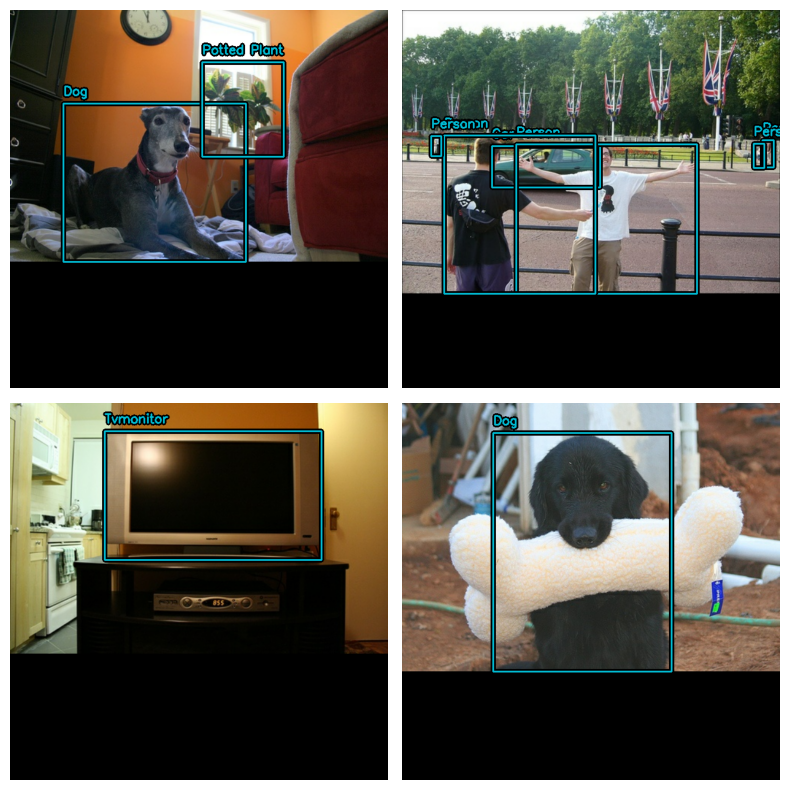

In [ ]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат рамок
    from_logits=True, # предсказания в виде логитов
    iou_threshold=0.5, # порог перекрытия
    confidence_threshold=0.75, # порог уверенности
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

Превосходно!
Наконец, еще один полезный шаблон кода, на заметку, визуализация обнаружений `keras.callbacks.Callback` для мониторинга процесса обучения:

In [ ]:
# класс обратного вызова для оценки процесса обучения
class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        visualize_detections(
            self.model, bounding_box_format="xywh", dataset=visualization_ds
        )

## Заключения и следующие шаги

KerasCV позволяет легко создать конвейеры по обнаружению объектов.
В данном руководстве, мы начинали с написания загрузчика данных, используя описание характеристик объектных рамок в KerasCV
Далее, мы собрали конвейер данных производственного уровня для аугментации, используя предпроцессные уровни KerasCV с кодом менее 50 строк.

Компоненты KerasCV по обнаружению объектов могут быть использованы независимо друг от друга, но в тоже время, имеют тесную интеграцию между собой.

KerasCV позволяет на профессиональном уровне производить аугментацию объектных рамок, обучение модели, визуализацию и подсчет метрик.

Немного заданий для читателя:

- добавьте дополнительную технику аугментации для улучшения производительности модели
- настройте гиперпараметры и аугментацию данных для получения результатов высокого качества
- обучите модель по обнаружению объектов на личном наборе данных

И в заключении небольшой забавный код, для демонстрации мощи API KerasCV!

<font color=green><i>Пример распознавания сгенерированных кошек с помощью предобученной модели</i></font>

In [ ]:
# слой NonMaxSuppression, позволяет контролировать подавление немаксимумов
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh", # формат объектных рамок
    from_logits=True, # применение логитов, позволяет обойтись без функции активации в данном слое.
    iou_threshold=0.2, # уменьшая порог IOU, отсекаем плохо распознаные объекты
    confidence_threshold=0.7, # настройка порога уверенности позволяет контролировать подавление немаксимумов
)
# получаем настройки предобученной модели YOLO
model2 = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", # модель YOLO, предобученная на картинках из набора Pascal VOC
    bounding_box_format="xywh", # формат объектных рамок
    prediction_decoder=prediction_decoder, # тип декодера, в нашем случае, он определен выше - подавление немаксимумов
)

/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL++-M license at https://github.com/Stability-AI/stablediffusion/blob/main/LICENSE-MODEL
50/50 [==============================] - 217s 2s/step


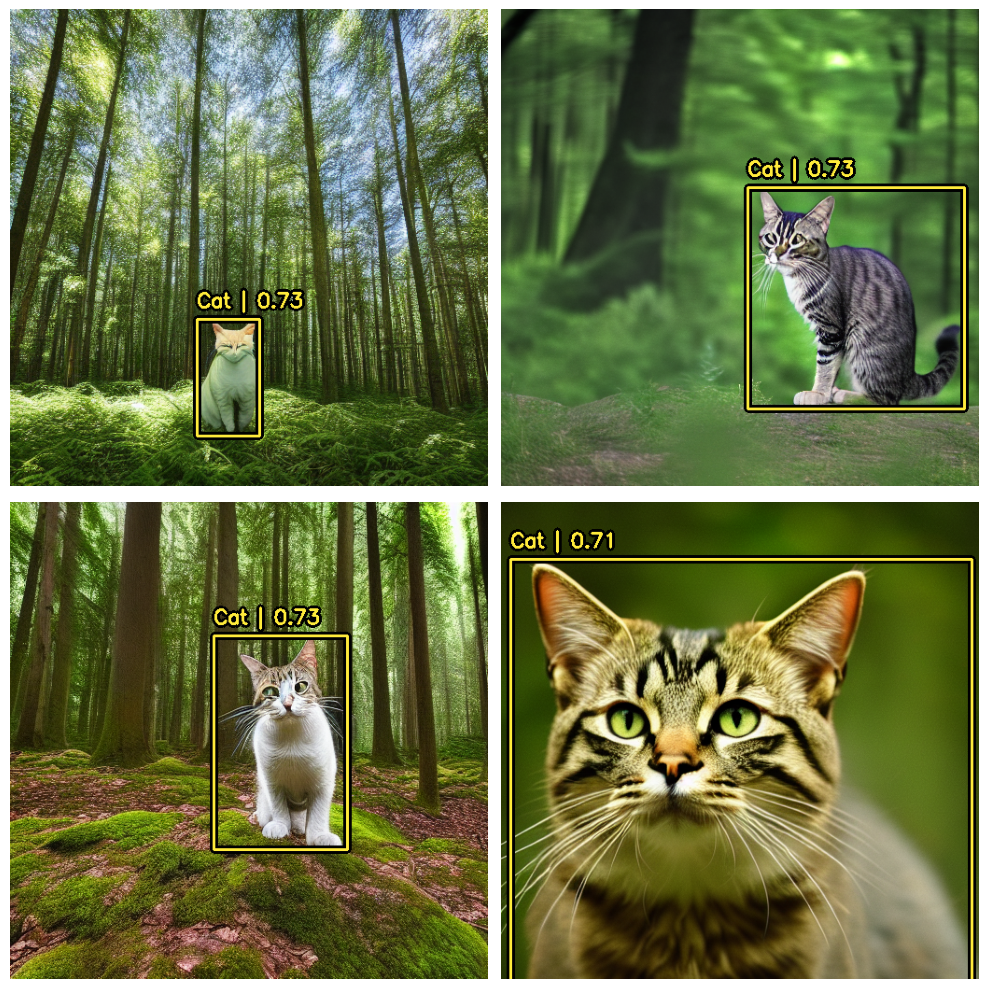

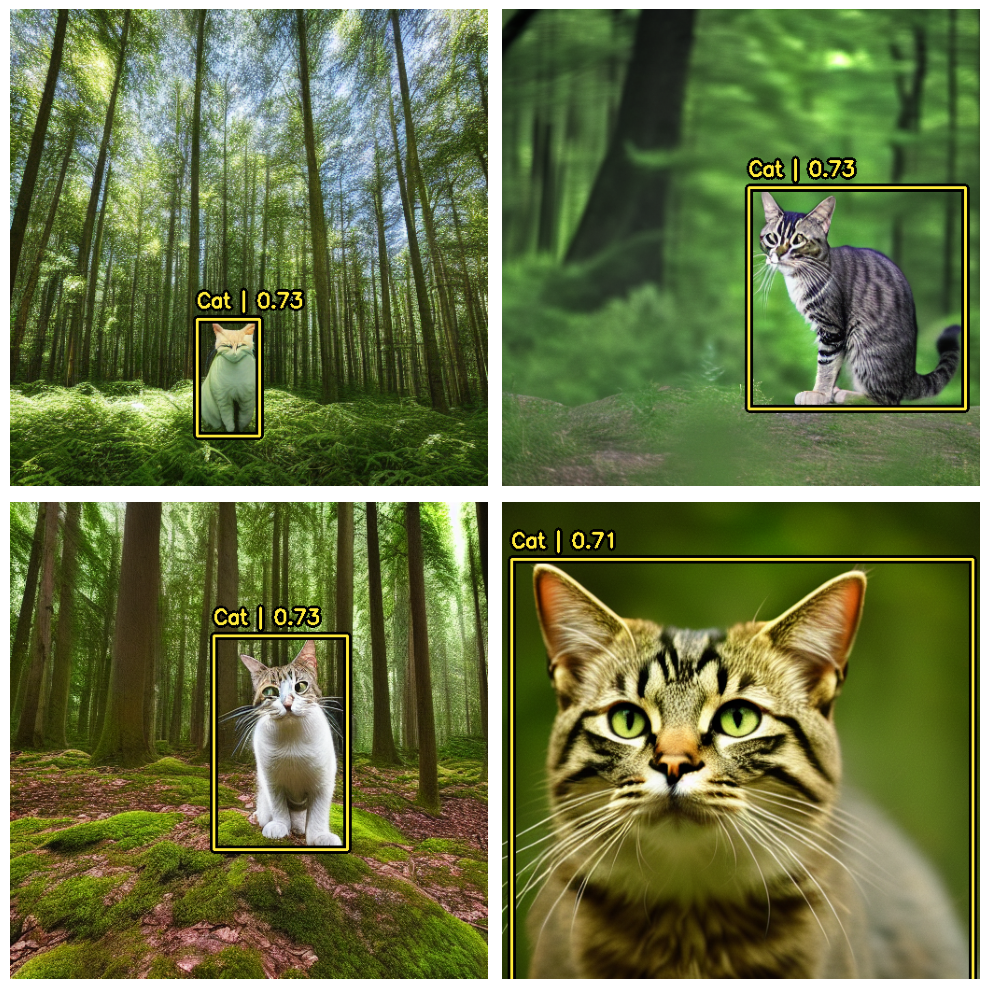

In [ ]:
# демонстрирует использование предобученной модели для обнаружения объектов на изображениях, которые были
# сгенерированы с использованием модели генерации изображений Stable Diffusion V2.
stable_diffusion = keras_cv.models.StableDiffusionV2(512, 512)
# Генерируются изображения с использованием модели
# Stable Diffusion V2 на основе текстовых описаний.
images = stable_diffusion.text_to_image(
    prompt="A zoomed out photograph of a cool looking cat.  The cat stands in a beautiful forest",
    negative_prompt="unrealistic, bad looking, malformed",
    batch_size=4, # 4 картинки
    seed=1231, # зафиксируем случайность
)
# получение закодированных предсказаний от модели
encoded_predictions = model2(images)
# декодироване предсказаний
y_pred = model2.decode_predictions(encoded_predictions, images)
# визуализация в виде галереи
visualization.plot_bounding_box_gallery(
    images,
    value_range=(0, 255),
    y_pred=y_pred,
    rows=2,
    cols=2,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

In [ ]:
history_dict = history.history

# Выводим названия метрик
print("Доступные метрики:", list(history_dict.keys()))

# Выводим значения метрик и функции потерь для каждой эпохи
for metric_name, values in history_dict.items():
    print(f"\n{metric_name}:")
    for epoch, value in enumerate(values, start=1):
        print(f"Эпоха {epoch}: {value}")


Доступные метрики: ['loss', 'box_loss', 'class_loss', 'val_AP', 'val_AP50', 'val_AP75', 'val_APs', 'val_APm', 'val_APl', 'val_ARmax1', 'val_ARmax10', 'val_ARmax100', 'val_ARs', 'val_ARm', 'val_ARl']

loss:
Эпоха 1: 33.65186309814453
Эпоха 2: 3.2162938117980957
Эпоха 3: 2.5158424377441406
Эпоха 4: 2.2541375160217285
Эпоха 5: 2.099196195602417
Эпоха 6: 1.9990512132644653
Эпоха 7: 1.9244650602340698
Эпоха 8: 1.864590048789978
Эпоха 9: 1.811631441116333
Эпоха 10: 1.7651000022888184
Эпоха 11: 1.720901370048523

box_loss:
Эпоха 1: 2.7296524047851562
Эпоха 2: 2.230231285095215
Эпоха 3: 2.0141007900238037
Эпоха 4: 1.9041205644607544
Эпоха 5: 1.8181113004684448
Эпоха 6: 1.7586315870285034
Эпоха 7: 1.7070759534835815
Эпоха 8: 1.665013313293457
Эпоха 9: 1.6251282691955566
Эпоха 10: 1.5888408422470093
Эпоха 11: 1.553786277770996

class_loss:
Эпоха 1: 30.92220687866211
Эпоха 2: 0.9860638380050659
Эпоха 3: 0.5017423033714294
Эпоха 4: 0.35001522302627563
Эпоха 5: 0.2810835540294647
Эпоха 6: 0.2404187

<h2 style="color: green; font-style: italic">Выводы</h2>
<font color="green"><i>
В данной домашней работе мною выполнен полный (не машинный) перевод оригинального текста статьи.<br>
ИМХО, данный гайд, не рассчитан на новичков, он непоследователен и плохо структурирован.<br> Автор постоянно перескакивает, от предобученных моделей к обучаемым, по ходу пьесы загружаются по несколько раз модели и их предустанови, в результате чего получается каша и тратятся вычислительные ресурсы.<br>Даже последние строки кода перемешаны с первыми и наоборот.<br>Но, я все же постарался "зеленым текстом" зачистить "красные пятна" ошибок и "белые" - недосказанности.<br><br>
В статье, оставлял заметки и пояснения, исправлял брошенные исключения.<br>
Почти для каждой строки кода, мною вставлены комментарии, помогающее понять суть происходящего.<br><br>
Одной из первых ошибок авторов статьи, является версионность пакетов.<br>
Есть ошибки, несвязанные с автором, например HTTP Error 429: Картинка с собакой и цветками оказалась настолько популярной, что владельцы веб-сервера, где размещено изображение, ограничили количество скачиваний в час. Пришлось менять ссылку на другой источник с такой же картинкой.<br>
Одна картинка с собакой не показательна, поэтому добавил более насыщенную с техникой.<br><br>
Возможно, ошибка допущена и авторами датасета, а именно непропорциональное разбиение данных:<br>В качестве тестовых данных используется более 4500 рисунков. В то время как тренировочных данных почти в два раза меньше - 2500.<br>Что приводит к переполнению памяти при обучении.<br>В машинном обучении, рекомендуется, для тестовых денных использовать 10% от объема тренировочных данных.<br><br>
По непонятным причинам, авторы статьи, не используют валидационный набор данных из датасета Pascal VOC, а это 2510 картинок.<br><br>
Во избежание утечек памяти, и не хватки ресурсов колаба, сократил количество тестовых данных.<br><br>Авторами статьи рекомендовано использовать от 10 до 35 и более эпох обучения. Что достаточно требовательно к ресурсам даже на T4 GPU колаба. Процесс прохождения одной эпохи занимает около 15 минут. Модель обучалась на 2500 рисунках, что не так уж и много, были мысли объединить с валидационными данными, чтобы в сумме учебных данных оказалось более 5 тысяч.<br> Но, с увеличенным тренировочным набором необходимо только на обучение: 35*30=1050 минут или 17,5 часов.<br> Машинного времени на одной учетке колаба не хватило и пришлось использовать 4 учетные записи, где ресурсы благополучно исчерпались тоже. Можно, конечно завести десятки аккаунтов, но, это тема другого курса: "Распределенные вычисления".<br><br>
Судя по выводу от обучения модели, объектные рамки начинают распознаваться только на 6 эпохе обучения. Поэтому, 10 эпох является минимумом, для хорошего обнаружения.<br><br>
Для достижения хорошего результата, интуитивно поигрался со скоростью обучения, моментумом и нормой градиентов.
В результате  исследований не осталось ресурсов даже на то, чтобы прогнать сгенерированных кошек через обученную модель для последующего сравнения с предобученной, вторая успешно обнаруживает кошек, что автором статьи не было правильно реализовано, из-за чего кошки просто генерировались, но не распознавались. Нашел и тут ошибку, допущенную автором: По непонятным причинам, автор на протяжении всего гайда преобразует картинки и делает аугментацию в формат 640х640 пикселей. А оригинальные картинки, в учебном наборе данных 512х512 пикселей, такое впечатление, что автор намеренно пытается запутать читателя.<br><br>
В заключении вывел метрики полученные в процессе обучения, каждую отдельно с указанием значений по эпохам:
<ul style="color: green;">
<li>loss: Общая функция потерь.</li>
<li>box_loss: Функция потерь для объектных рамок.</li>
<li>class_loss: Потери, связанные с классификацией объектов.</li>
<li>val_AP: Средняя точность обнаружения (Average Precision) на тестовом наборе данных. Это метрика, которая оценивает качество обнаружения объектов.</li>
<li>val_AP50: Средняя точность обнаружения при пороге IoU (Intersection over Union) в 0.5.</li>
<li>val_AP75: Средняя точность обнаружения при пороге IoU в 0.75.</li>
<li>val_APs, val_APm, val_APl: Средняя точность обнаружения для маленьких, средних и больших объектов соответственно.</li>
<li>val_ARmax1, val_ARmax10, val_ARmax100: Среднее значение частоты обнаружения при максимальном числе пропусков в одном изображении (1, 10, 100).</li>
<li>val_ARs: Средняя частота обнаружения (Average Recall) для маленьких объектов на тестовом наборе данных. Это означает, что эта метрика оценивает, насколько успешно модель обнаруживает маленькие объекты.</li>
<li>val_ARm: Средняя частота обнаружения для средних объектов на тестовом наборе данных.</li>
<li>val_ARl: Средняя частота обнаружения для больших объектов на тестовом наборе данных.</li>
</ul>
</i></font>